In [297]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import io
import json
import geojson
import base64
import urllib
import folium
import requests
from bs4 import BeautifulSoup
from folium import plugins
from sklearn import preprocessing

In [298]:
fares = pd.read_csv('http://web.mta.info/developers/data/nyct/fares/fares_181215.csv', skiprows=2)
fares.drop(fares.columns[len(fares.columns)-1], axis=1, inplace=True)
fares.rename(columns={' STATION':'station'}, inplace=True)
fares.station = fares.station.apply(lambda x: x.strip())

In [299]:
fares.rename(columns={'10-T':'10 TRIP',
                    '14-D':'14 DAY',
                    '1-D': '1 DAY/FUNPASS',
                    '2-T':'2 TRIP',
                    '30-D':'30 DAY',
                    '7-D':'7 DAY',
                    'ADA':'ADA ACT',
                    'AFAS' : 'ADA FARECARD ACCESS',
                    'EXP': 'EXPRESS',
                    'EZPAY' : 'EASY PAY',
                    'FF' : 'FULL FARE',
                    'MC' : 'METROCARD',
                    'MR' : 'MAIL AND RIDE',
                    'MTHLY' :'MONTHLY',
                    'RFM':'REDUCED FARE MEDIA',
                    'RR' : 'RAIL ROAD',
                    'SEN/DIS' : 'SENIOR /DISABLED',
                    'SPEC' : 'SPECIAL',
                    'TCMC': 'TRANSIT CHECK METROCARD',
                    'TKT' :'TICKET',
                    'UNL' : 'UNLIMITED',
                    'XBUS'  : 'EXPRESS BUS',
                    'STUDENT' : 'STUDENT USAGE'}, inplace=True)

In [300]:
fares.shape
fares.head()

(509, 28)

,REMOTE,station,FULL FARE,SENIOR /DISABLED,7-D AFAS UNL,30-D AFAS/RMF UNL,JOINT RR TKT,7-D UNL,30-D UNL,14-D RFM UNL,...,MR EZPAY UNL,PATH 2-T,AIRTRAIN FF,AIRTRAIN 30-D,AIRTRAIN 10-T,AIRTRAIN MTHLY,STUDENTS,NICE 2-T,CUNY-120,CUNY-60
0,R001,WHITEHALL STREET,67725,3055,470,1130,292,32196,37032,0,...,882,0,1534,0,0,0,3654,0,842,0
1,R003,CYPRESS HILLS,3148,182,31,42,0,2456,1337,0,...,29,0,26,0,0,0,852,0,92,0
2,R004,75TH STREET & ELDERTS LANE,7277,442,32,142,0,5467,3805,0,...,54,0,54,0,0,0,3153,0,105,0
3,R005,85TH STREET & FOREST PKWAY,8345,629,75,226,3,5583,4270,0,...,74,0,80,0,0,0,1813,0,224,0
4,R006,WOODHAVEN BOULEVARD,8686,616,89,258,1,8116,5420,0,...,100,0,89,0,0,0,2334,0,262,0


In [13]:
def wiki_search(search_string):
    print('Begin looking for: ' + search_string + '...')
    try:
        page = requests.get("https://www.google.com/search?q=" + search_string + ' station')
        soup = BeautifulSoup(page.content, 'html.parser')
        links = [link.get('href') for link in soup.find_all('a')]
        wiki = links[[index for index, link in enumerate(links) if 'wikipedia' in link][0]]
        wiki = re.search('/url\?q=(.+?)&sa=U&', wiki).group(1)
        wiki = urllib.parse.unquote(wiki)
        print('Found wiki link for: ' + search_string + '...')
        return wiki
    except:
        print('Error encounted for: ' + search_string + '...')
        return np.nan
    
def lat_lon(x):
    try:
        print('Searching lat/lon for: ' + x['wiki'])
        page = requests.get(x['wiki'])
        soup = BeautifulSoup(page.content, 'html.parser')
        geo = soup.find('span', class_='geo-dec')
        geo = geo.text
        lat = float(geo[:geo.find('N')-1])
        lon = geo[geo.find(' '):].strip()
        lon = -float(lon[:lon.find('W')-1])
        print('Success!')
    except:
        lat, lon = np.nan, np.nan
        print('Fail...')
    return lat, lon

In [67]:
wiki_links = {}
for station in fares.station.unique():
    wiki_links[station] = wiki_search(station) 

Begin looking for: WHITEHALL STREET...
Found wiki link for: WHITEHALL STREET...
Begin looking for: CYPRESS HILLS...
Found wiki link for: CYPRESS HILLS...
Begin looking for: 75TH STREET & ELDERTS LANE...
Found wiki link for: 75TH STREET & ELDERTS LANE...
Begin looking for: 85TH STREET & FOREST PKWAY...
Found wiki link for: 85TH STREET & FOREST PKWAY...
Begin looking for: WOODHAVEN BOULEVARD...
Found wiki link for: WOODHAVEN BOULEVARD...
Begin looking for: 104TH STREET...
Found wiki link for: 104TH STREET...
Begin looking for: 111TH STREET...
Found wiki link for: 111TH STREET...
Begin looking for: 121ST STREET...
Found wiki link for: 121ST STREET...
Begin looking for: 42ND STREET & 8TH AVENUE...
Found wiki link for: 42ND STREET & 8TH AVENUE...
Begin looking for: 34TH STREET & 8TH AVENUE...
Found wiki link for: 34TH STREET & 8TH AVENUE...
Begin looking for: FULTON STREET...
Found wiki link for: FULTON STREET...
Begin looking for: FIFTH AVENUE...
Found wiki link for: FIFTH AVENUE...
Begin 

Found wiki link for: 50TH STREET & 7TH AVENUE...
Begin looking for: 242ND STREET & BROADWAY...
Found wiki link for: 242ND STREET & BROADWAY...
Begin looking for: CANAL STREET...
Found wiki link for: CANAL STREET...
Begin looking for: FORDHAM ROAD & JEROME AVE...
Found wiki link for: FORDHAM ROAD & JEROME AVE...
Begin looking for: MORRISON AVE & WESTCHESTER...
Found wiki link for: MORRISON AVE & WESTCHESTER...
Begin looking for: QUEENSBORO PLAZA...
Found wiki link for: QUEENSBORO PLAZA...
Begin looking for: 90TH STREET/ELMHURST AVENUE...
Found wiki link for: 90TH STREET/ELMHURST AVENUE...
Begin looking for: FRANKLIN AVE/EASTERN PKWY...
Found wiki link for: FRANKLIN AVE/EASTERN PKWY...
Begin looking for: KINGSTON AVE/EASTERN PKWY...
Found wiki link for: KINGSTON AVE/EASTERN PKWY...
Begin looking for: BROAD STREET & WALL STREET...
Found wiki link for: BROAD STREET & WALL STREET...
Begin looking for: 175TH STREET/FT WASHINGTON...
Found wiki link for: 175TH STREET/FT WASHINGTON...
Begin loo

Found wiki link for: 149TH ST-GRAND CONCOURSE...
Begin looking for: 125TH STREET-LENOX AVENUE...
Found wiki link for: 125TH STREET-LENOX AVENUE...
Begin looking for: 135TH STREET-LENOX AVENUE...
Found wiki link for: 135TH STREET-LENOX AVENUE...
Begin looking for: 103RD ST-ROOSEVELT AVE...
Found wiki link for: 103RD ST-ROOSEVELT AVE...
Begin looking for: STERLING ST-NOSTRAND AVE...
Found wiki link for: STERLING ST-NOSTRAND AVE...
Begin looking for: BEVERLY RD-NOSTRAND AVE...
Found wiki link for: BEVERLY RD-NOSTRAND AVE...
Begin looking for: KINGS HIGHWAY-EAST 16TH ST...
Found wiki link for: KINGS HIGHWAY-EAST 16TH ST...
Begin looking for: 59TH STREET-4TH AVENUE...
Found wiki link for: 59TH STREET-4TH AVENUE...
Begin looking for: BAY RIDGE AVE-4TH AVENUE...
Found wiki link for: BAY RIDGE AVE-4TH AVENUE...
Begin looking for: 77TH STREET-4TH AVENUE...
Found wiki link for: 77TH STREET-4TH AVENUE...
Begin looking for: 86TH STREET-4TH AVENUE...
Found wiki link for: 86TH STREET-4TH AVENUE...
B

Found wiki link for: BAYCHESTER AVE-TILLOTSON...
Begin looking for: 34TH STREET - PENN STATION...
Found wiki link for: 34TH STREET - PENN STATION...
Begin looking for: MORGAN AVENUE-HARRISON PL...
Found wiki link for: MORGAN AVENUE-HARRISON PL...
Begin looking for: WILSON AVENUE-MOFFAT STREET...
Found wiki link for: WILSON AVENUE-MOFFAT STREET...
Begin looking for: 163RD ST & AMSTERDAM AVE...
Found wiki link for: 163RD ST & AMSTERDAM AVE...
Begin looking for: FRANKLIN AVENUE-FULTON ST...
Found wiki link for: FRANKLIN AVENUE-FULTON ST...
Begin looking for: NORTHERN BLVD-BROADWAY...
Found wiki link for: NORTHERN BLVD-BROADWAY...
Begin looking for: BROADWAY - UNION AVENUE...
Found wiki link for: BROADWAY - UNION AVENUE...
Begin looking for: 2ND AVENUE-HOUSTON STREET...
Found wiki link for: 2ND AVENUE-HOUSTON STREET...
Begin looking for: YORK STREET-JAY STREET...
Found wiki link for: YORK STREET-JAY STREET...
Begin looking for: 21ST STREET-QUEENSBRIDGE...
Found wiki link for: 21ST STREET-Q

Found wiki link for: KOSCIUSZKO STREET-BROADWAY...
Begin looking for: GATES AVENUE-BROADWAY...
Found wiki link for: GATES AVENUE-BROADWAY...
Begin looking for: HALSEY STREET-BROADWAY...
Found wiki link for: HALSEY STREET-BROADWAY...
Begin looking for: GRANT AVENUE-PITKIN AVENUE...
Found wiki link for: GRANT AVENUE-PITKIN AVENUE...
Begin looking for: HUDSON STREET-78TH STREET...
Found wiki link for: HUDSON STREET-78TH STREET...
Begin looking for: BOYD STREET-88TH STREET...
Found wiki link for: BOYD STREET-88TH STREET...
Begin looking for: ROCKAWAY BLVD-LIBERTY AVE...
Found wiki link for: ROCKAWAY BLVD-LIBERTY AVE...
Begin looking for: 174TH STREET-SOUTHERN BLVD...
Found wiki link for: 174TH STREET-SOUTHERN BLVD...
Begin looking for: EAST TREMONT AVENUE-178 ST...
Error encounted for: EAST TREMONT AVENUE-178 ST...
Begin looking for: EAST 180TH ST-MORRIS PARK...
Found wiki link for: EAST 180TH ST-MORRIS PARK...
Begin looking for: BRONX PARK EAST...
Found wiki link for: BRONX PARK EAST...
B

Found wiki link for: CASEY STENGEL DEPOT...
Begin looking for: JAMAICA DEPOT...
Found wiki link for: JAMAICA DEPOT...
Begin looking for: FRESH POND DEPOT...
Found wiki link for: FRESH POND DEPOT...
Begin looking for: EAST NEW YORK DEPOT...
Found wiki link for: EAST NEW YORK DEPOT...
Begin looking for: JACKIE GLEASON DEPOT...
Found wiki link for: JACKIE GLEASON DEPOT...
Begin looking for: FLATBUSH DEPOT...
Found wiki link for: FLATBUSH DEPOT...
Begin looking for: ULMER PARK DEPOT...
Found wiki link for: ULMER PARK DEPOT...
Begin looking for: KINGSBRIDGE DEPOT...
Found wiki link for: KINGSBRIDGE DEPOT...
Begin looking for: JACKIE GLEASON DEPOT(2)...
Found wiki link for: JACKIE GLEASON DEPOT(2)...
Begin looking for: MOTHER CLARA HALE DEPOT...
Found wiki link for: MOTHER CLARA HALE DEPOT...
Begin looking for: MANHATTANVILLE DEPOT...
Found wiki link for: MANHATTANVILLE DEPOT...
Begin looking for: CHARLESTON DEPOT...
Found wiki link for: CHARLESTON DEPOT...
Begin looking for: WEST FARMS DEPO

In [68]:
len(wiki_links)

497

In [69]:
w = pd.DataFrame(pd.Series(wiki_links), columns=['wiki'])
w.head()

,wiki
WHITEHALL STREET,https://en.wikipedia.org/wiki/South_Ferry/Whit...
CYPRESS HILLS,https://en.wikipedia.org/wiki/Cypress_Hills_(B...
75TH STREET & ELDERTS LANE,https://en.wikipedia.org/wiki/75th_Avenue_(IND...
85TH STREET & FOREST PKWAY,https://en.wikipedia.org/wiki/85th_Street_(Man...
WOODHAVEN BOULEVARD,https://en.wikipedia.org/wiki/Woodhaven_Boulev...


In [70]:
w.wiki.isna().sum()

10

In [72]:
latlon = w.apply(lat_lon, axis=1)
w[['lat', 'lon']] = latlon.apply(pd.Series)

Searching lat/lon for: https://en.wikipedia.org/wiki/South_Ferry/Whitehall_Street_(New_York_City_Subway)
Searching lat/lon for: https://en.wikipedia.org/wiki/Cypress_Hills_(BMT_Jamaica_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/75th_Avenue_(IND_Queens_Boulevard_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/85th_Street_(Manhattan)
Searching lat/lon for: https://en.wikipedia.org/wiki/Woodhaven_Boulevard_(IND_Queens_Boulevard_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/104th_Street_(BMT_Jamaica_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/111th_Street_(IRT_Flushing_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/121st_Street_(BMT_Jamaica_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/42nd_Street_(musical)
Searching lat/lon for: https://en.wikipedia.org/wiki/34th_Street_(Manhattan)
Searching lat/lon for: https://en.wikipedia.org/wiki/Fulton_Street_(New_York_City_Subway)
Searching lat/lon for: https://en.wikipe

Searching lat/lon for: https://en.wikipedia.org/wiki/Flatbush_Avenue
Searching lat/lon for: https://en.wikipedia.org/wiki/23rd_Street_(Manhattan)
Searching lat/lon for: https://en.wikipedia.org/wiki/Fordham_Road_(IND_Concourse_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Seventh_Avenue_(band)
Searching lat/lon for: https://en.wikipedia.org/wiki/Parsons_Boulevard_(IND_Queens_Boulevard_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/169th_Street_(IND_Queens_Boulevard_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/50th_Street_(Manhattan)
Searching lat/lon for: https://en.wikipedia.org/wiki/Van_Cortlandt_Park%E2%80%93242nd_Street_(IRT_Broadway%E2%80%93Seventh_Avenue_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Canal_Street_(New_York_City_Subway)
Searching lat/lon for: https://en.wikipedia.org/wiki/Fordham_Road
Searching lat/lon for: https://en.wikipedia.org/wiki/Morrison_Avenue%E2%80%93Soundview_(IRT_Pelham_Line)
Searching lat/lon for: htt

Searching lat/lon for: https://en.wikipedia.org/wiki/161st_Street%E2%80%93Yankee_Stadium_(New_York_City_Subway)
Searching lat/lon for: https://en.wikipedia.org/wiki/Prospect_Park_(BMT_lines)
Searching lat/lon for: https://en.wikipedia.org/wiki/36th_Street_(BMT_Fourth_Avenue_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Nostrand_Avenue_(IND_Fulton_Street_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Kingston%E2%80%93Throop_Avenues_(IND_Fulton_Street_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Euclid_Avenue_(IND_Fulton_Street_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Woodhaven_Boulevard_(IND_Queens_Boulevard_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/63rd_Drive%E2%80%93Rego_Park_(IND_Queens_Boulevard_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/23rd_Street_(IND_Sixth_Avenue_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Church_Avenue_(IND_Culver_Line)
Searching lat/lon for: https://en.wiki

Searching lat/lon for: https://en.wikipedia.org/wiki/Clinton%E2%80%93Washington_Avenues_(IND_Fulton_Street_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Beach_60th_Street_(IND_Rockaway_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Myrtle_Avenue_(BMT_Jamaica_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Classon_Avenue_(IND_Crosstown_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Seventh_Avenue_(IND_Culver_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Fort_Hamilton_Parkway_(IND_Culver_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Houston_Street_(IRT_Broadway%E2%80%93Seventh_Avenue_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/33rd_Street%E2%80%93Rawson_Street_(IRT_Flushing_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Baychester_Avenue_(IRT_Dyre_Avenue_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/34th_Street%E2%80%93Penn_Station_(IRT_Broadway%E2%80%93Seventh_Avenue_Line)
S

Searching lat/lon for: https://en.wikipedia.org/wiki/79th_Street_(IRT_Broadway%E2%80%93Seventh_Avenue_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/86th_Street_(IND_Eighth_Avenue_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/20th_Avenue_(BMT_West_End_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Bay_Parkway_(BMT_West_End_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/New_Lots_Avenue_(IRT_New_Lots_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/East_105th_Street_(BMT_Canarsie_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Flushing_Avenue_(BMT_Jamaica_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Myrtle_Avenue_(BMT_Jamaica_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Kosciuszko_Street_(BMT_Jamaica_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Gates_Avenue_(BMT_Jamaica_Line)
Searching lat/lon for: https://en.wikipedia.org/wiki/Halsey_Street_(BMT_Jamaica_Line)
Searching lat/lon

Searching lat/lon for: https://en.wikipedia.org/wiki/Bus_depots_of_MTA_Regional_Bus_Operations
Searching lat/lon for: https://en.wikipedia.org/wiki/Bus_depots_of_MTA_Regional_Bus_Operations
Searching lat/lon for: https://en.wikipedia.org/wiki/Bus_depots_of_MTA_Regional_Bus_Operations
Searching lat/lon for: https://en.wikipedia.org/wiki/Bus_depots_of_MTA_Regional_Bus_Operations
Searching lat/lon for: https://en.wikipedia.org/wiki/Bus_depots_of_MTA_Regional_Bus_Operations
Searching lat/lon for: https://en.wikipedia.org/wiki/Bus_depots_of_MTA_Regional_Bus_Operations
Searching lat/lon for: https://en.wikipedia.org/wiki/Bus_depots_of_MTA_Regional_Bus_Operations
Searching lat/lon for: https://en.wikipedia.org/wiki/Bus_depots_of_MTA_Regional_Bus_Operations
Searching lat/lon for: https://en.wikipedia.org/wiki/Bus_depots_of_MTA_Regional_Bus_Operations
Searching lat/lon for: https://en.wikipedia.org/wiki/Bus_depots_of_MTA_Regional_Bus_Operations
Searching lat/lon for: https://en.wikipedia.org/wi

In [74]:
w.head()
w.lat.isna().sum()

,wiki,lat,lon
WHITEHALL STREET,https://en.wikipedia.org/wiki/South_Ferry/Whit...,40.70250,-74.012800
CYPRESS HILLS,https://en.wikipedia.org/wiki/Cypress_Hills_(B...,40.68972,-73.873060
75TH STREET & ELDERTS LANE,https://en.wikipedia.org/wiki/75th_Avenue_(IND...,40.71864,-73.837738
85TH STREET & FOREST PKWAY,https://en.wikipedia.org/wiki/85th_Street_(Man...,40.78060,-73.960400
WOODHAVEN BOULEVARD,https://en.wikipedia.org/wiki/Woodhaven_Boulev...,40.73347,-73.870397


29

In [76]:
w.to_csv('wiki_links.csv')

In [301]:
w = pd.read_csv('wiki_links.csv')
w.index = w.iloc[:,0]
fares['lat'] = fares.station.map(w.lat)
fares['lon'] = fares.station.map(w.lon)

In [302]:
fares.loc[fares.station == '42ND STREET & 8TH AVENUE', ['lat', 'lon']] = 40.756, -73.987
fares.loc[fares.station == '42ND STREET & 6TH AVENUE', ['lat', 'lon']] = 40.754847, -73.984122
fares.loc[fares.station == 'FULTON & WILLIAM STREETS', ['lat', 'lon']] = 40.710206, -74.007744
fares.loc[fares.station == '42ND STREET & GRAND CENTRAL', ['lat', 'lon']] = 40.752283, -73.977519
fares.loc[fares.station == '42ND STREET & 3RD AVENUE', ['lat', 'lon']] = 40.750833, -73.974389
fares.loc[fares.station == 'FIFTH AVENUE & 42ND STREET', ['lat', 'lon']] = 40.7548, -73.9842
fares.loc[fares.station == '8TH STREET & BROADWAY', ['lat', 'lon']] = 40.730543, -73.992448
fares.loc[fares.station == 'FIFTH AVENUE & 60TH STREET', ['lat', 'lon']] = 40.764779, -73.972621
fares.loc[fares.station == 'ASTORIA BLVD & 31ST STREET', ['lat', 'lon']] = 40.769979, -73.918161
fares.loc[fares.station == 'DITMARS BLVD & 31ST STREET', ['lat', 'lon']] = 40.776089, -73.910737
fares.loc[fares.station == 'FLATBUSH AVE & NOSTRAND AV', ['lat', 'lon']] = 40.632361, -73.947486
fares.loc[fares.station == 'SEVENTH AVENUE & WEST 53RD', ['lat', 'lon']] = 40.762959, -73.981891
fares.loc[fares.station == 'BEVERLEY ROAD -EAST 15TH ST', ['lat', 'lon']] = 40.644625, -73.964472
fares.loc[fares.station == 'EAST TREMONT AVENUE-178 ST', ['lat', 'lon']] = 40.843070, -73.848450
fares.dropna(inplace=True)

In [303]:
fares['total'] = fares.drop(columns=['REMOTE', 'station', 'lat', 'lon']).sum(axis=1)

In [304]:
fares.shape
fares.head()

(494, 31)

,REMOTE,station,FULL FARE,SENIOR /DISABLED,7-D AFAS UNL,30-D AFAS/RMF UNL,JOINT RR TKT,7-D UNL,30-D UNL,14-D RFM UNL,...,AIRTRAIN 30-D,AIRTRAIN 10-T,AIRTRAIN MTHLY,STUDENTS,NICE 2-T,CUNY-120,CUNY-60,lat,lon,total
0,R001,WHITEHALL STREET,67725,3055,470,1130,292,32196,37032,0,...,0,0,0,3654,0,842,0,40.70250,-74.012800,160629
1,R003,CYPRESS HILLS,3148,182,31,42,0,2456,1337,0,...,0,0,0,852,0,92,0,40.68972,-73.873060,8421
2,R004,75TH STREET & ELDERTS LANE,7277,442,32,142,0,5467,3805,0,...,0,0,0,3153,0,105,0,40.71864,-73.837738,21256
3,R005,85TH STREET & FOREST PKWAY,8345,629,75,226,3,5583,4270,0,...,0,0,0,1813,0,224,0,40.78060,-73.960400,22048
4,R006,WOODHAVEN BOULEVARD,8686,616,89,258,1,8116,5420,0,...,0,0,0,2334,0,262,0,40.73347,-73.870397,26883


In [305]:
def create_tooltip(x):
    table = x[['station', 'total']]
    table.index = ['Station:  ', 'Riders:  ']
    table = table.to_frame().to_html(header=False, escape=False)
    table = table.replace('border="1"', 'border="0"')
    table = table.replace('<th>', '<th valign="top">')
    return table

def create_popup(x):
    station = x.station
    x = x.drop(labels=['REMOTE', 'station', 'lat', 'lon', 'total', 'weights'])
    x = x[x > 0].sort_values()
    fig, ax = plt.subplots()
    _ = x.plot.barh(title = 'Ridership Breakdown for ' + station)   
    img = io.BytesIO()
    fig.savefig(img, format='png', bbox_inches='tight')
    img.seek(0)
    encoded = base64.b64encode(img.getvalue())
    html = '<img src="data:image/png;base64, {}">'.format(encoded.decode('utf-8'))
    return folium.Popup(html=html, max_width=600)

def add_markers(x):
    lat, lon = x.lat, x.lon
    popup = create_popup(x)
    tooltip = create_tooltip(x)
    return folium.CircleMarker([lat, lon], radius=10, tooltip=tooltip, popup=popup,
                               fill=True, opacity=0.01, fill_opacity=0.01).add_to(m)

In [306]:
# Modified code from: https://gis.stackexchange.com/questions/220997/pandas-to-geojson-multiples-points-features-with-python

def df_to_geojson(df, properties, lat='latitude', lng='longitude'):
    """
    Turn a dataframe containing point data into a geojson formatted python dictionary

    df : the dataframe to convert to geojson
    properties : a list of columns in the dataframe to turn into geojson feature properties
    lat : the name of the column in the dataframe that contains latitude data
    lng : the name of the column in the dataframe that contains longitude data
    """

    # create a new python dict to contain our geojson data, using geojson format
    geojson = {'type':'FeatureCollection', 'features':[]}

    # loop through each row in the dataframe and convert each row to geojson format
    # x is the equivalent of the row, df.iterrows converts the dataframe in to a pd.series object
    # the x is a counter and has no influence
    for x, row in df.iterrows():

        feature = {'type':'Feature',
                   'properties':{},
                   'geometry':{'type':'Point',
                               'coordinates':[]},
                   'style':{'icon':{'iconUrl':'http://downloadicons.net/sites/default/files/small-house-with-a-chimney-icon-70053.png',
                                    'iconSize':[0,0],
                                    'iconAnchor':[16,16]}}
                  }

        # fill in the coordinates
        feature['geometry']['coordinates'] = [float(row[lng]),float(row[lat])]

        # be aware that the dataframe is a pd.series
        #print('rowitem converts to ndarray(numpy) :\n ', row)
        # convert the array to a pandas.serie
        geo_props = pd.Series(row)

        # for each column, get the value and add it as a new feature property
        # prop determines the list from the properties
        for prop in properties:

            #loop over the items to convert to string elements

            #convert to string
            if type(geo_props[prop]) == float:
                #print('ok')
                geo_props[prop] = str(int(geo_props[prop]))

            # now create a json format, here we have to make the dict properties
            feature['properties'][prop] = geo_props[prop]

        # add this feature (aka, converted dataframe row) to the list of features inside our dict
        geojson['features'].append(feature)
    return geojson

In [307]:
geojson = df_to_geojson(fares, properties=['lat', 'lon', 'station'], lat='lat', lng='lon')

In [315]:
total = fares.total.values
scaler = preprocessing.StandardScaler()
#scaler = preprocessing.MinMaxScaler()
total = total.reshape((total.shape[0],1))
fares['weights'] = scaler.fit_transform(total)
heatmap_data = fares[['lat', 'lon', 'weights']].values

C:\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


In [318]:
m = folium.Map(location=[40.73711, -73.83293], 
               zoom_start=12,
               tiles='cartodbdark_matter')

_ = plugins.HeatMap(heatmap_data, 
                    radius=12,
                    max_zoom=15).add_to(m)

_ = plugins.MousePosition().add_to(m)

C:\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


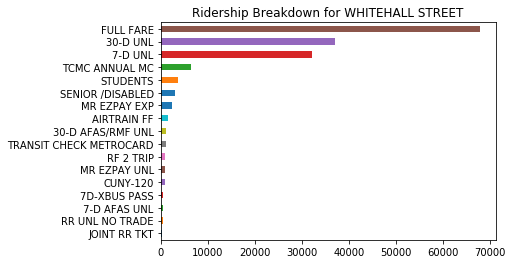

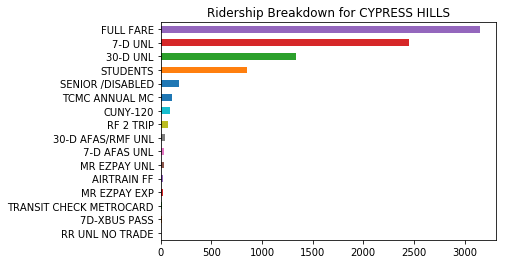

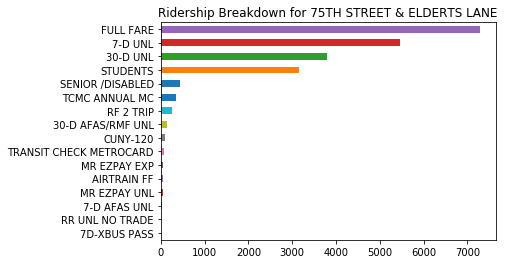

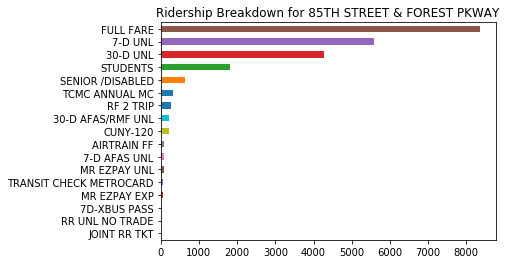

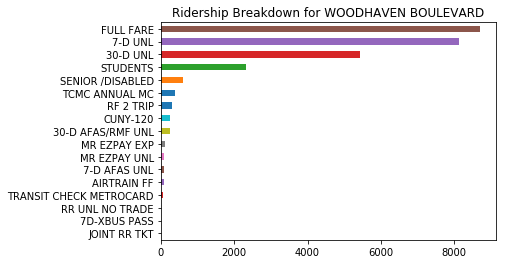

...

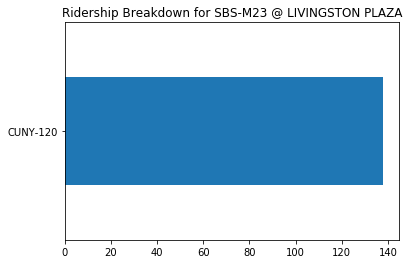

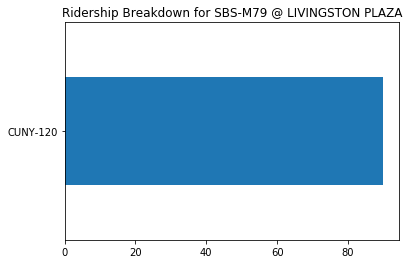

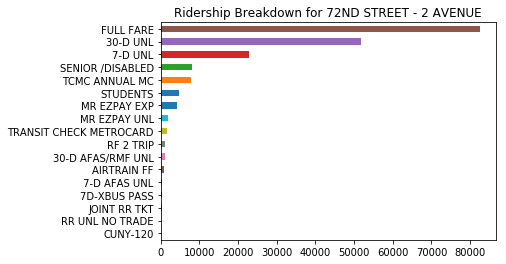

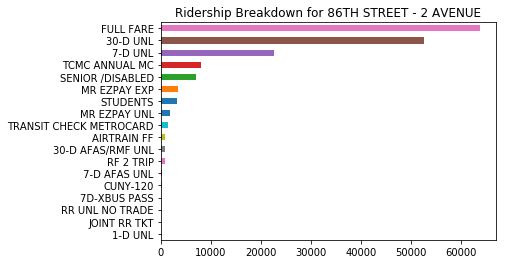

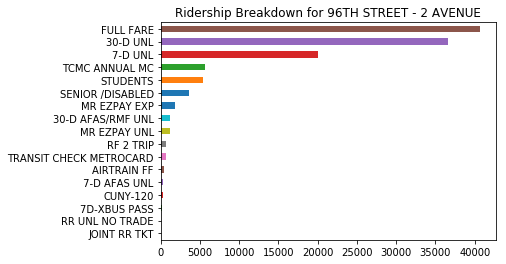

In [319]:
_ = fares.apply(add_markers, axis=1)

In [320]:
# Uncommitted updates for plugins.Search from: https://github.com/ghandic/folium/blob/master/folium/plugins/search.py

from __future__ import (absolute_import, division, print_function)

from branca.element import CssLink, Figure, JavascriptLink, MacroElement

from jinja2 import Template


class Search(MacroElement):
    """
    Adds a search tool to your map.
    Parameters
    ----------
    position : str
          change the position of the search bar, can be:
          'topleft', 'topright', 'bottomright' or 'bottomleft'
          default: 'topleft'
    See https://github.com/stefanocudini/leaflet-search for more information.
    """

    def __init__(self, data, search_zoom=12, search_label='name', geom_type='Point',
                 position='topleft', popup_on_found=True):
        super(Search, self).__init__()
        self.position = position
        self.data = data
        self.search_label = search_label
        self.search_zoom = search_zoom
        self.geom_type = geom_type
        self.popup_on_found = popup_on_found

        self._template = Template("""
        {% macro script(this, kwargs) %}
            var {{this.get_name()}} = new L.geoJson.css({{this.data}});
            {{this._parent.get_name()}}.addLayer({{this.get_name()}});
            if ('{{this.geom_type}}' == 'Point'){
                var searchControl = new L.Control.Search({
                    layer: {{this.get_name()}},
                    propertyName: '{{this.search_label}}',
                    initial: false,
                    zoom: {{this.search_zoom}},
                    position:'{{this.position}}',
                    hideMarkerOnCollapse: true
                });
                if ({{'true' if this.popup_on_found else 'false'}}) {
                    searchControl.on('search:locationfound', function(e) {
                        if(e.layer._popup)
                            e.layer.openPopup();
                    });
                };
            } else if ('{{this.geom_type}}' == 'Polygon') {
                var searchControl = new L.Control.Search({
                    layer: {{this.get_name()}},
                    propertyName: '{{this.search_label}}',
                    marker: false,
                    position:'{{this.position}}',
                    moveToLocation: function(latlng, title, map) {
                        var zoom = {{this._parent.get_name()}}.getBoundsZoom(latlng.layer.getBounds());
                        {{this._parent.get_name()}}.setView(latlng, zoom); // access the zoom
                    }
                });
                searchControl.on('search:locationfound', function(e) {
                    e.layer.setStyle({fillColor: '#3f0', color: '#0f0'});
                    if(e.layer._popup)
                        e.layer.openPopup();
                }).on('search:collapsed', function(e) {
                    {{this.get_name()}}.eachLayer(function(layer) {   //restore feature color
                        {{this.get_name()}}.resetStyle(layer);
                    }); 
                });
            }
    
            {{this._parent.get_name()}}.addControl( searchControl ); 
        {% endmacro %}
        """)  # noqa

    def render(self, **kwargs):
        super(Search, self).render()

        figure = self.get_root()
        assert isinstance(figure, Figure), ('You cannot render this Element '
                                            'if it is not in a Figure.')

        figure.header.add_child(
            JavascriptLink('https://cdn.jsdelivr.net/npm/leaflet-search@2.3.6/dist/leaflet-search.min.js'),  # noqa
            name='Leaflet.Search.js'
        )

        figure.header.add_child(
            CssLink('https://cdn.jsdelivr.net/npm/leaflet-search@2.3.6/dist/leaflet-search.min.css'),  # noqa
            name='Leaflet.Search.css'
        )

        figure.header.add_child(
            JavascriptLink('https://cdn.rawgit.com/albburtsev/Leaflet.geojsonCSS/master/leaflet.geojsoncss.min.js'),  # noqa
            name='Leaflet.GeoJsonCss.js'
        )

In [321]:
_ = Search(data=geojson, search_zoom=15, search_label='station', 
           geom_type='Point', position='topleft', popup_on_found=True).add_to(m)

In [322]:
m.save('test.html')